Downloading all the Dependencies

In [ ]:
# Importing TensorFlow 2.0
%tensorflow_version 2.x
import tensorflow as tf

# Download and import MIT 6.S191 package
!pip install mitdeeplearning
import mitdeeplearning as mdl

# Importing all remaining packages
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
!apt-get install abcmidi timidity > /dev/null 2>&1

# Checking the GPU
assert len(tf.config.list_physical_devices("GPU")) > 0

Downloading Dataset

In [ ]:
# Dataset
songs = mdl.lab1.load_training_data()

# Printing one of the songs and inspecting the details
example_song = songs[5]
print("\nExample song: ")
print(example_song)

Found 816 songs in text

Example song: 
X:7
T:Boys of Bluehill
Z: id:dc-hornpipe-7
M:C|
L:1/8
K:D Major
dB|BAFA DAFA|BA (3Bcd e2de|fagf egfe|dfed B2dB|!
BAFA DAFA|BA (3Bcd e2de|fagf egfe|d2dc d2:|!
fg|afdf a2gf|gfga b2ag|fagf egfe|dfed B2dB|!
BAFA DAFA|BA (3Bcd e2de|fagf egfe|d2dc d2:|!


In [ ]:
# Joining our list of songs into single string containing all songs
songs_joined = "\n\n".join(songs)

# Finding all the unique characters in the joined string
vocab = sorted(set(songs_joined))
print("There are", len(vocab), "unique characters in the dataset")

There are 83 unique characters in the dataset


Processing the Dataset for Learning Task

In [ ]:
# Vectorize the Text

### Numerical Representation of Text ###
char2idx = {u:i for i,u in enumerate(vocab)}

### Mapping from indices to characters ###
idx2char = np.array(vocab)

In [ ]:
print("{")
for char,_ in zip(char2idx, range(10)):
  print("  {:4s}: {:3d},".format(repr(char), char2idx[char]))
print("....\n")

{
  '\n':   0,
  ' ' :   1,
  '!' :   2,
  '"' :   3,
  '#' :   4,
  "'" :   5,
  '(' :   6,
  ')' :   7,
  ',' :   8,
  '-' :   9,
....



In [ ]:
### Vectorizing the Songs String ###
def vectorize_string(string):
  vectorized_songs = np.array([char2idx[song] for song in string])
  return vectorized_songs

vectorized_songs = vectorize_string(songs_joined)

In [ ]:
### Checking the vectorized_songs is a numpy array
print("{}---characters mapped to int---> {}".format(repr(songs_joined[:10]), vectorized_songs[:10]))

assert isinstance(vectorized_songs, np.ndarray), "returned result should be a numpy array"

'X:2\nT:An B'---characters mapped to int---> [49 22 14  0 45 22 26 69  1 27]


Creating Training Examples and Target

In [ ]:
### Batching to create Training Examples ###
def get_batch(vectorized_songs, seq_length, batch_size):
  # length of vectorized song string
  n = vectorized_songs.shape[0] - 1

  # randomly chosing the starting indices for the training batch
  idx = np.random.choice(n-seq_length, batch_size)

  input_batch = [vectorized_songs[i:i+seq_length] for i in idx]
  output_batch = [vectorized_songs[i+1:i+seq_length+1] for i in idx]

  x_batch = np.reshape(input_batch, [batch_size, seq_length])
  y_batch = np.reshape(output_batch, [batch_size, seq_length])

  return x_batch, y_batch

In [ ]:
x_batch, y_batch = get_batch(vectorized_songs, seq_length=5, batch_size=1)

for i, (input_idx, target_idx) in enumerate(zip(np.squeeze(x_batch), np.squeeze(y_batch))):
  print("Step {:3d}".format(i))
  print("  input: {} ({:s})".format(input_idx, repr(idx2char[input_idx])))
  print("  expected output: {} ({:s})".format(target_idx, repr(idx2char[target_idx])))


Step   0
  input: 82 ('|')
  expected output: 31 ('F')
Step   1
  input: 31 ('F')
  expected output: 32 ('G')
Step   2
  input: 32 ('G')
  expected output: 26 ('A')
Step   3
  input: 26 ('A')
  expected output: 27 ('B')
Step   4
  input: 27 ('B')
  expected output: 1 (' ')


The Recurrent Neural Network (RNN) Model

In [ ]:
### Defining the LSTM model ###
def LSTM(rnn_units):
  return tf.keras.layers.LSTM(
      rnn_units,
      return_sequences=True,
      recurrent_initializer="glorot_uniform",
      recurrent_activation="sigmoid",
      stateful=True
  )

In [ ]:
### Defining the RNN model ###
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
                               tf.keras.layers.Embedding(vocab_size, embedding_dim,
                                                         batch_input_shape=[batch_size, None]),
                               LSTM(rnn_units),
                               tf.keras.layers.Dense(vocab_size)
  ])

  return model


#### Building Simple model with default hyperparameters ###
model = build_model(len(vocab), embedding_dim=256, rnn_units=1024, batch_size=32)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (32, None, 256)           21248     
_________________________________________________________________
lstm (LSTM)                  (32, None, 1024)          5246976   
_________________________________________________________________
dense (Dense)                (32, None, 83)            85075     
Total params: 5,353,299
Trainable params: 5,353,299
Non-trainable params: 0
_________________________________________________________________


In [ ]:
### Checking the dimensionality of the Output ###
x, y = get_batch(vectorized_songs, seq_length=100, batch_size=32)
pred = model(x)

print("Input shape: ", x.shape)
print("Prediction shape: ", pred.shape)

Input shape:  (32, 100)
Prediction shape:  (32, 100, 83)


Predictions from the Untrained model

In [ ]:
sampled_indices = tf.random.categorical(pred[0], num_samples=1)
sampled_indices = tf.squeeze(sampled_indices, axis=-1).numpy()
sampled_indices

array([76, 12, 22, 77, 39, 30, 16, 58, 45, 66, 61, 58, 22, 72,  5, 61, 62,
        9,  3, 14,  0, 29, 67,  9,  4,  3, 43, 62, 20, 75,  2, 56, 10,  2,
       60, 52, 15, 77, 47, 35,  5, 12, 11, 29, 17, 80, 60, 66, 57, 81, 10,
       15, 40, 28, 21, 16, 44, 50,  1, 70, 56, 33, 60, 64, 26, 42,  6, 23,
       46, 31, 40, 28, 11, 27, 18, 76, 82, 77, 38, 29, 52, 45, 19, 41,  1,
       48, 78, 68, 39, 21, 43, 27, 55, 26,  7, 75, 49, 72, 11, 30])

In [ ]:
print("Input: \n", repr("".join(idx2char[x[0]])))
print()
print("Next Char Predictions: \n", repr("".join(idx2char[sampled_indices])))

Input: 
 'cde dcBA|!\nd2a2 fgaf|efge fgaf|gabg fdfa|gfed dcBA|!\nBdBd gBgB|AdAd fAfA|GBGB efed|c2Bc A3G|!\nFGAF E'

Next Char Predictions: 
 'u0:vNE4cTkfc:q\'fg-"2\nDl-#"Rg8t!a.!e[3vVJ\'0/D5yekbz.3OC94SY oaHeiAQ(<UFOC/B6u|vMD[T7P WwmN9RB_A)tXq/E'


Training the Model: loss and training operations

In [ ]:
### Defining the loss function ###
def compute_loss(labels, logits):
  loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
  return loss


### Computing the loss function ###
example_batch_loss = compute_loss(y, pred)
print("Prediction shape: ", pred.shape)
print("scalar_loss: ", example_batch_loss.numpy().mean())

Prediction shape:  (32, 100, 83)
scalar_loss:  4.418351


In [ ]:
### Hyperparameter setting and optimization ###

# Optimization parameters:
num_training_iterations = 2000
batch_size = 8
seq_length = 200
learning_rate = 5e-3

# Model parameters:
vocab_size = len(vocab)
embedding_dim = 256
rnn_units = 1500

# Checkpoint location:
checkpoint_dir = "./training_checkpoints"
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")

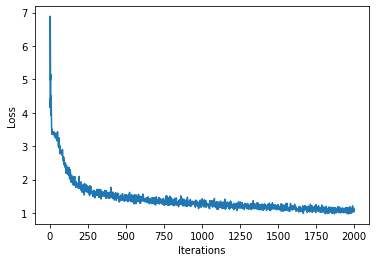

100%|██████████| 2000/2000 [35:28<00:00,  1.06s/it]


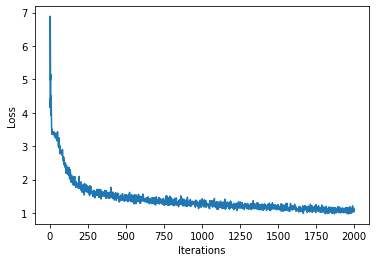

In [ ]:
### Defining optimizer and training operations ###
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size)
optimizer = tf.keras.optimizers.Adagrad(learning_rate)


@tf.function
def train_step(x, y):
  with tf.GradientTape() as tape:

    y_hat = model(x)
    loss = compute_loss(y, y_hat)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss

#################
# Begin training
#################

history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel="Iterations", ylabel="Loss")
if hasattr(tqdm, "_instances"): tqdm._instances.clear()

for iter in tqdm(range(num_training_iterations)):
  x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
  loss = train_step(x_batch, y_batch)

  # Update the progress bar
  history.append(loss.numpy().mean())
  plotter.plot(history)

  # Update the model with changed weights!
  if iter % 100 == 0:
    model.save_weights(checkpoint_prefix)

  # Save the trained model and the weights
  model.save_weights(checkpoint_prefix)

Generating Music using RNN model

In [ ]:
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size=1)
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (1, None, 256)            21248     
_________________________________________________________________
lstm_2 (LSTM)                (1, None, 1500)           10542000  
_________________________________________________________________
dense_2 (Dense)              (1, None, 83)             124583    
Total params: 10,687,831
Trainable params: 10,687,831
Non-trainable params: 0
_________________________________________________________________


In [ ]:
### Prediction of a generated song ###
def generate_text(model, start_string, generation_length=1000):
  # Convert the start string to numbers
  input_eval = [char2idx[num] for num in start_string]
  input_eval = tf.expand_dims([input_eval], 0)

  # Empty string 
  text_generated = []
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(generation_length)):
    predictions = model(input_eval)
    predictions = tf.squeeze(predictions, 0)
    # Using multinomial distribution
    predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()
    input_eval = tf.expand_dims([predicted_id], 0)

    text_generated.append(idx2char[predicted_id])
  return (start_string + "".join(text_generated))

In [ ]:
generated_text = generate_text(model, start_string="X", generation_length=1000)

100%|██████████| 1000/1000 [00:07<00:00, 128.22it/s]


Play back the generated music

In [ ]:
### Play back generated songs ###
generated_songs = mdl.lab1.extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs):
  waveform = mdl.lab1.play_song(song)

  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)

Found 2 songs in text
Generated song 0


Generated song 1
